In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import astropy.units as u # I use astropy units in everything, very helpful for bookkeeping/debugging

from lim import lim # The base intensity mapping object

matplotlib.rcParams.update({'font.size': 18,'figure.figsize':[8,7]}) # Make figures better
#matplotlib.rcParams,update({}'figure.figsize'] = [8,7]
from scipy.ndimage import gaussian_filter

In [3]:
# Initialize LineModel with default model
m = lim()
m_cii = lim('Lichen_v2', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [4]:
m_cii.update(tobs = 40000*u.hr)

In [5]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1
zs

array([5.80974359, 5.88031088, 5.95235602, 6.02592593, 6.10106952,
       6.17783784, 6.25628415, 6.33646409, 6.41843575, 6.50225989,
       6.588     , 6.67572254, 6.76549708, 6.85739645, 6.95149701,
       7.04787879, 7.14662577, 7.24782609, 7.35157233, 7.45796178,
       7.56709677])

In [3]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1
zs

array([5.78846918, 5.81556886, 5.84288577, 5.87042254, 5.89818182,
       5.92616633, 5.95437882, 5.98282209, 6.01149897, 6.04041237,
       6.06956522, 6.0989605 , 6.12860125, 6.15849057, 6.18863158,
       6.21902748, 6.24968153, 6.28059701, 6.3117773 , 6.34322581,
       6.374946  , 6.40694143, 6.43921569, 6.47177243, 6.50461538,
       6.53774834, 6.57117517, 6.60489978, 6.63892617, 6.67325843,
       6.70790068, 6.74285714, 6.77813212, 6.81372998, 6.84965517,
       6.88591224, 6.9225058 , 6.95944056, 6.99672131, 7.03435294,
       7.07234043, 7.11068884, 7.14940334, 7.18848921, 7.22795181,
       7.26779661, 7.3080292 , 7.34865526, 7.38968059, 7.43111111,
       7.47295285, 7.51521197, 7.55789474, 7.60100756])

In [5]:
zs[7]

5.982822085889565

In [21]:
dnu_t = np.linspace(1, 2, 10000)

In [22]:
lenz = [0 for i in range(len(dnu_t))]

for i in range(len(lenz)):

    m_cii.update(dnu = dnu_t[i]*u.GHz)
    
    lenz[i] = len((m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1)

(1.05, 1.15)

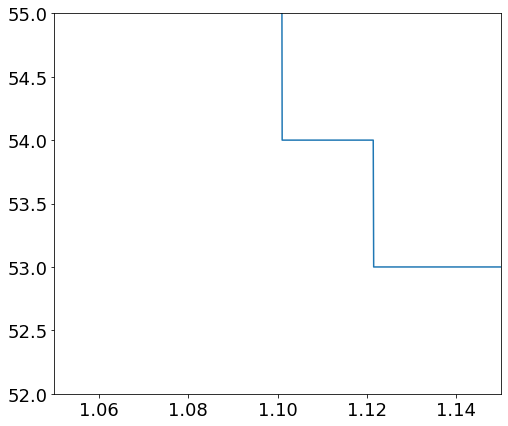

In [26]:
plt.plot(dnu_t, lenz)
plt.ylim([52, 55])
plt.xlim([1.05, 1.15])

In [6]:
signal = m_cii.maps

Loading .npz catalogues...


In [14]:
m_cii_v1 = lim('Lichen', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [15]:
signal_v1 = m_cii_v1.maps

Loading .npz catalogues...


In [3]:
signal = m_cii.maps
forecast = m_cii.noise_added_map

Loading .npz catalogues...


In [27]:
np.shape(signal)

(354, 354, 21)

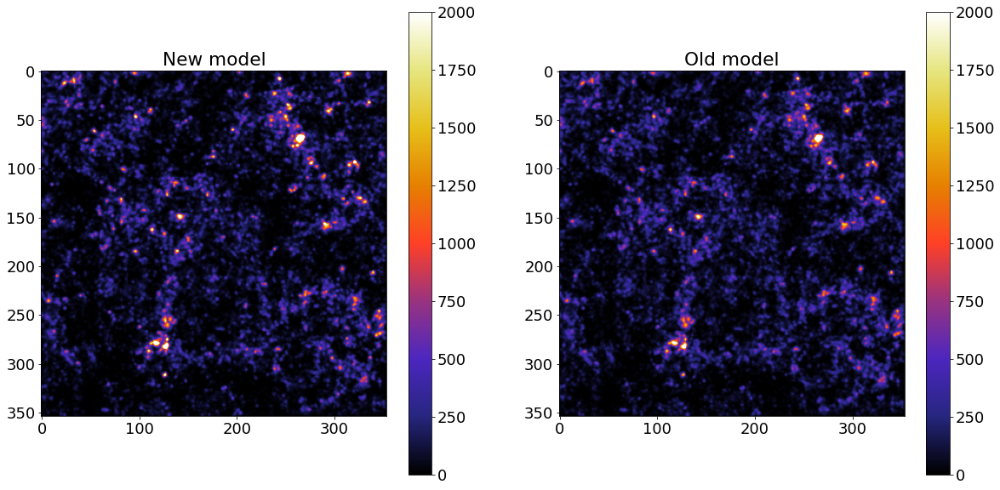

In [25]:
fig , axes = plt.subplots(nrows=1, ncols=2, figsize=(20,10))

plt.subplot(121)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('New model')
plt.colorbar()

plt.subplot(122)
plt.imshow(gaussian_filter(signal_v1[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('Old model')
plt.colorbar()

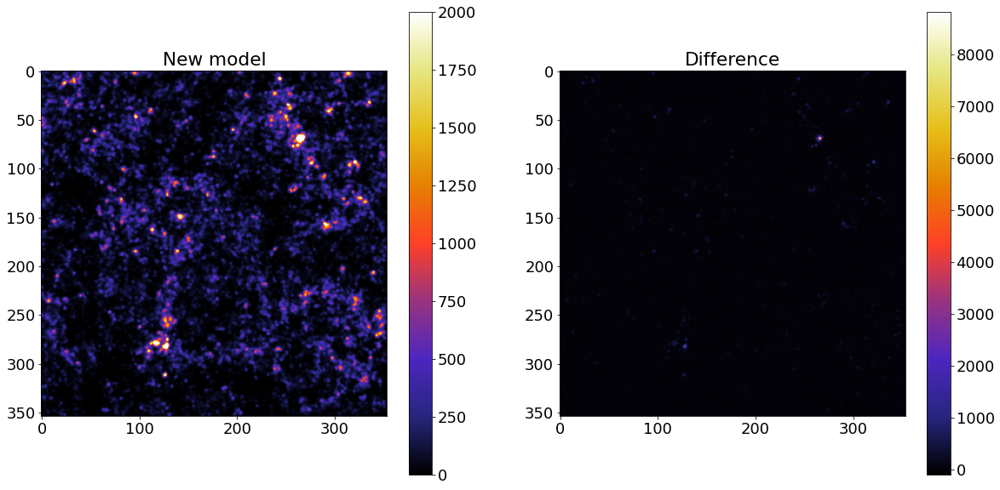

In [19]:
fig , axes = plt.subplots(nrows=1, ncols=2, figsize=(20,10))

plt.subplot(121)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), cmap = 'CMRmap', vmax = 2000)
plt.title('New model')
plt.colorbar()

plt.subplot(122)
plt.imshow(gaussian_filter((signal - signal_v1)[:, :, 3], 1), cmap = 'CMRmap')
plt.title('Difference')
plt.colorbar()

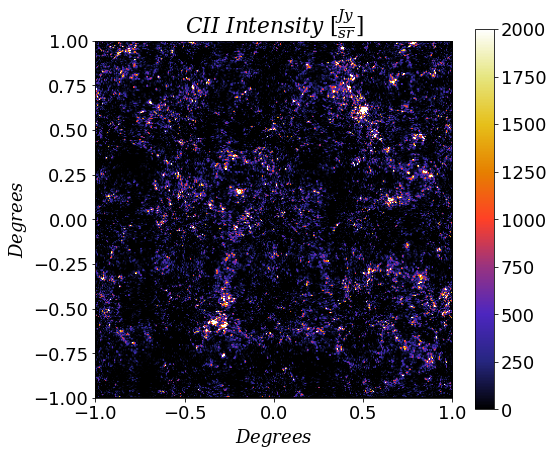

In [32]:
plt.imshow(signal[:, :, 3], cmap = 'CMRmap', vmax = 2000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()
plt.savefig('doga_CII_cb.pdf', bbox_inches = "tight")

In [8]:
zs[7]

5.982822085889565

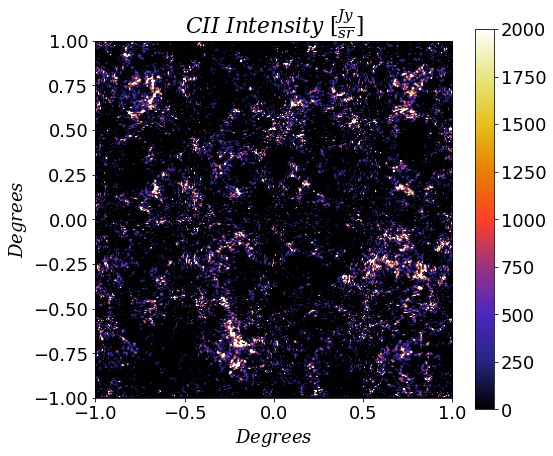

In [11]:
plt.imshow(signal[:, :, 7], cmap = 'CMRmap', vmax = 2000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

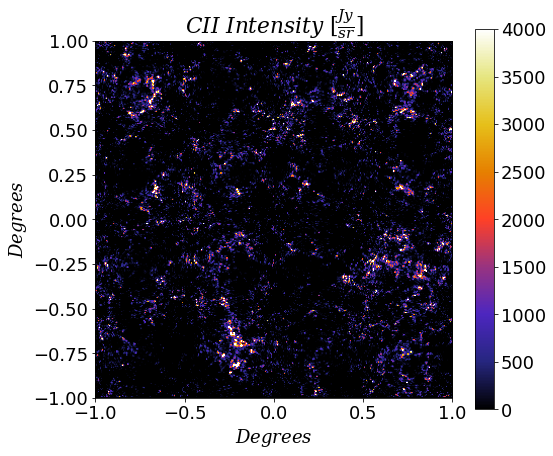

In [16]:
plt.imshow(signal[:, :, 7], cmap = 'CMRmap', vmax = 4000, extent = [-1, 1, -1, 1])
plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()
plt.savefig('cii_z6.pdf', bbox_inches = "tight")

In [5]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1

/tmp/ipykernel_3687984/1780570680.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


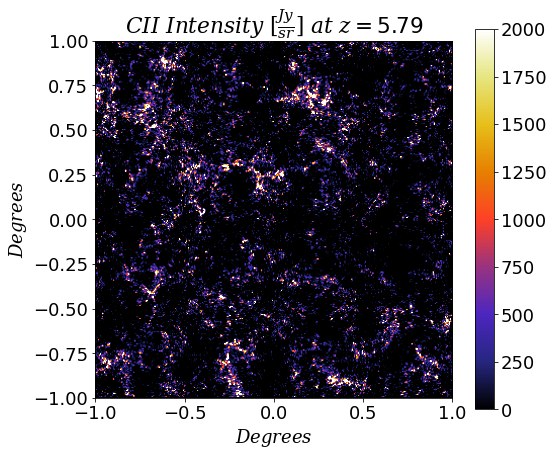

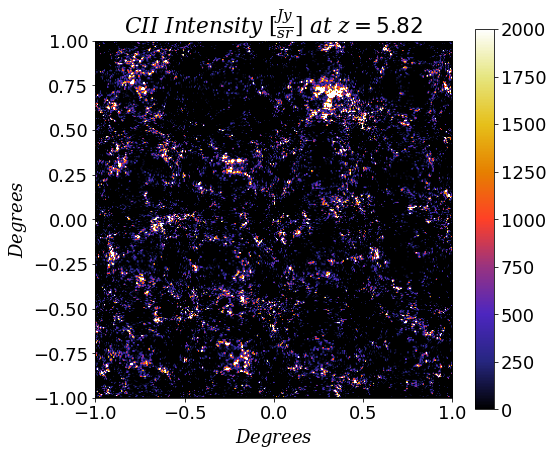

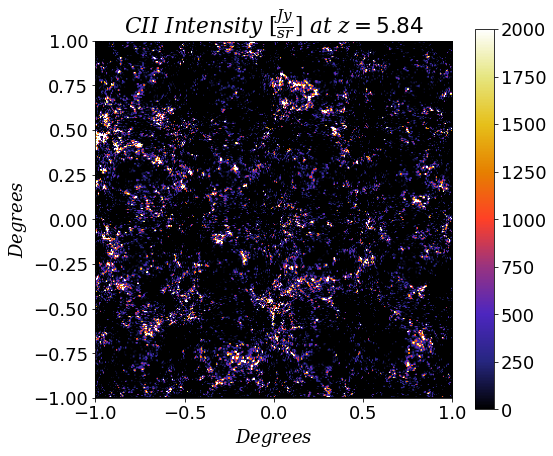

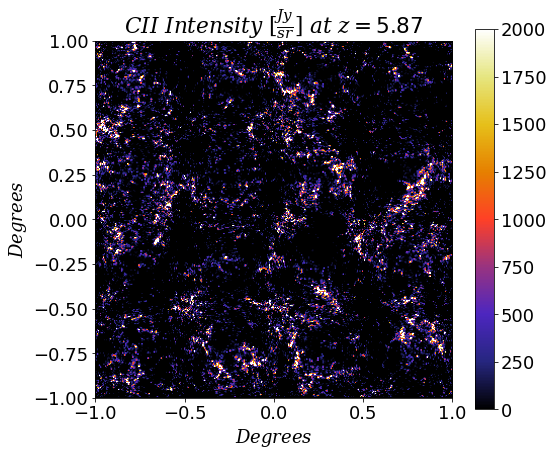

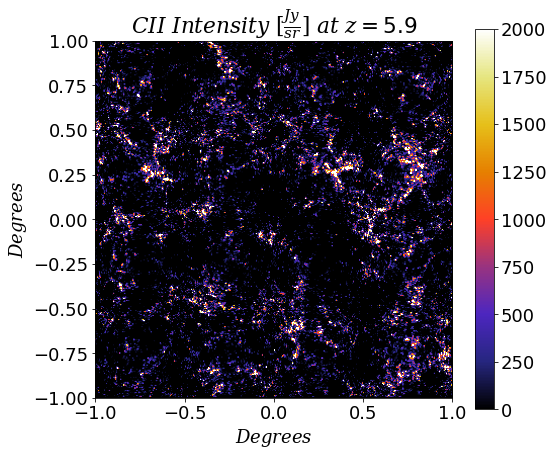

...

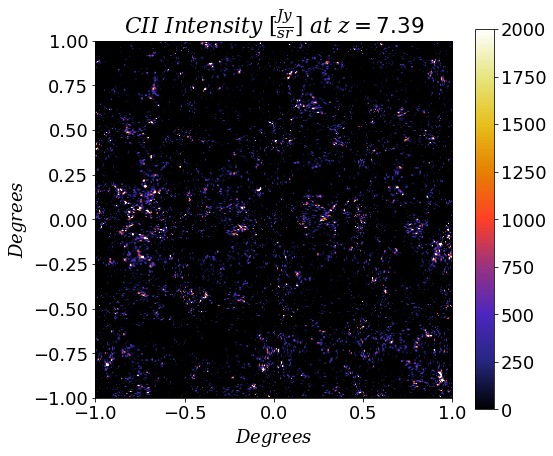

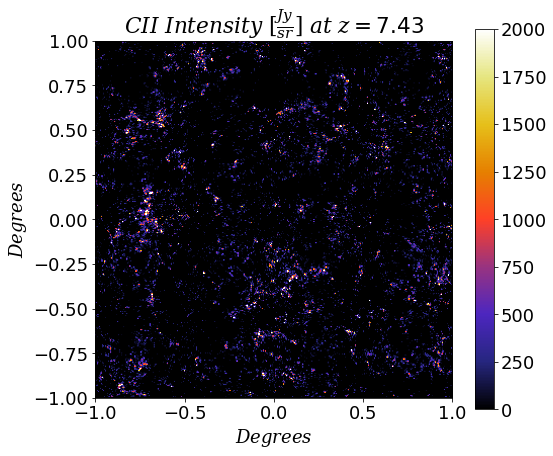

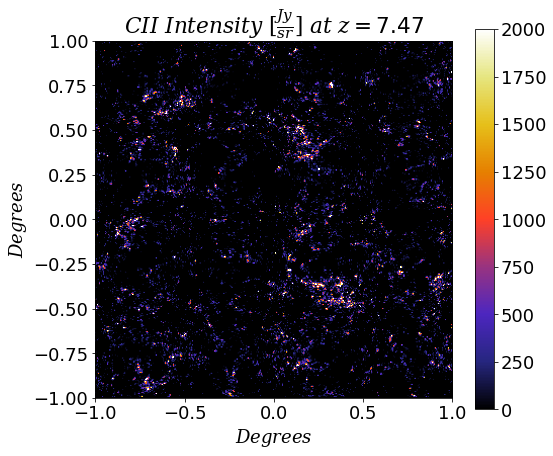

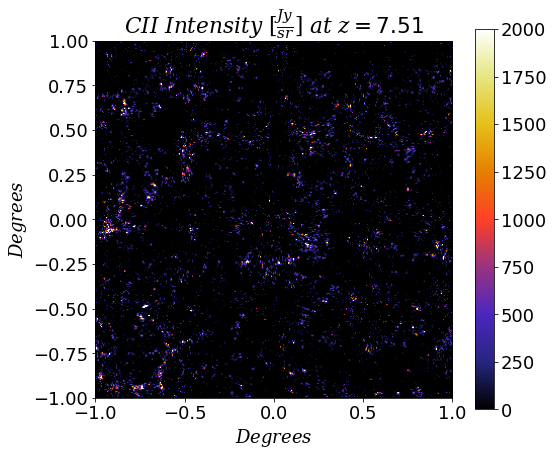

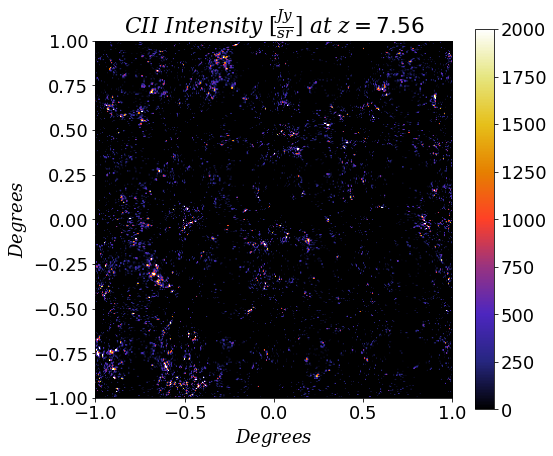

In [12]:
for i in range(len(zs) - 1):
    
    plt.figure(i)
    plt.imshow(signal[:, :, i], vmax = 2000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
    plt.title(r'$CII\ Intensity\ [\frac{Jy}{sr}]\ at\ z=$'+str(round(zs[i], 2)), math_fontfamily = 'dejavuserif')
    plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
    plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
    plt.colorbar()
    plt.savefig('cii_snaps/'+str(i)+'.png', bbox_inches = "tight")

In [13]:
list_stack = ['cii_snaps/'+str(i)+'.png' for i in range(len(zs) - 1)]

In [15]:
import imageio
with imageio.get_writer('cii_movie.gif', mode='I') as writer:
    for filename in list_stack:
        image = imageio.imread(filename)
        writer.append_data(image)

/tmp/ipykernel_3687984/2674283545.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [33]:
np.max(signal[:, :, 3])

<Quantity 70670.29404294 Jy / sr>

In [20]:
k_sim = m_cii.k_sim
Pk_sim = m_cii.Pk_sim

In [21]:
k_sim_v1 = m_cii_v1.k_sim
Pk_sim_v1 = m_cii_v1.Pk_sim

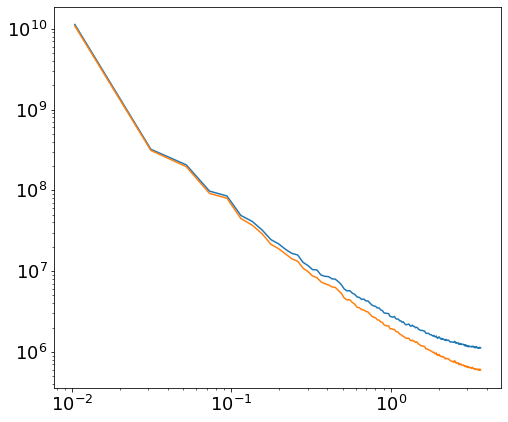

In [22]:
plt.plot(k_sim, Pk_sim)
plt.plot(k_sim_v1, Pk_sim_v1)
plt.xscale('log')
plt.yscale('log')

## Wiener Filtering

In [84]:
m_cii.tobs

<Quantity 2000. h>

In [85]:
Pnoise = m_cii.Pnoise.value

k_sim = m_cii.k_sim
Pk_sim = m_cii.Pk_sim

P_noise = np.array([Pnoise for i in range(len(k_sim))])

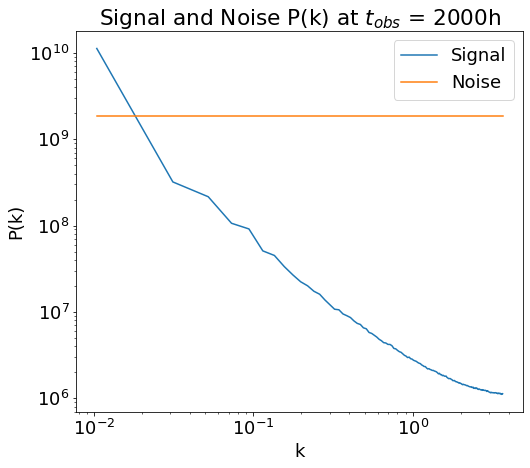

In [86]:
plt.plot(k_sim, Pk_sim, label = 'Signal')
plt.plot(k_sim, P_noise, label = 'Noise')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'Signal and Noise P(k) at $t_{obs}$ = 2000h')
plt.legend()

In [89]:
cii_ccatp = m_cii.noise_added_map

From `limlam_mocker.limlam_mocker.map_to_pspec()` :

In [87]:
from limlam_mocker.limlam_mocker import redshift_to_chi as rtc
from limlam_mocker.limlam_mocker import load_peakpatch_catalogue_cosmo as lppcc

x,y,z = m_cii.mapinst.pix_binedges_x, m_cii.mapinst.pix_binedges_y, m_cii.mapinst.nu_binedges
t     = cii_ccatp
cosmo = lppcc(m_cii.halo_info)
zco   = rtc(m_cii.mapinst.nu_rest/z - 1, cosmo)

avg_ctd = np.mean(zco)
xco     = x/(180)*np.pi*avg_ctd
yco     = y/(180)*np.pi*avg_ctd

dxco, dyco, dzco = [np.abs(np.mean(np.diff(d))) for d in (xco, yco, zco)]
Pk_3D            = np.abs(np.fft.rfftn(t)*dxco*dyco*dzco)**2/np.abs(np.ptp(xco)*np.ptp(yco)*np.ptp(zco))

kx        = 2*np.pi*np.fft.fftfreq(xco.size - 1, d = dxco)
ky        = 2*np.pi*np.fft.fftfreq(yco.size - 1, d = dyco)
kz        = 2*np.pi*np.fft.rfftfreq(zco.size - 1, d = dzco)

kgrid     = np.sqrt(sum(ki**2 for ki in np.meshgrid(kx, ky, kz, indexing = 'ij')))
dk        = max(np.diff(kx)[0], np.diff(ky)[0], np.diff(kz)[0])

kmax_dk   = int(np.ceil(max(np.amax(kx), np.amax(ky), np.amax(kz))/dk))
kbins     = np.linspace(0, kmax_dk*dk, kmax_dk + 1)

Pk_nmodes = np.histogram(kgrid[kgrid > 0], bins = kbins, weights = Pk_3D[kgrid > 0])[0]
nmodes    = np.histogram(kgrid[kgrid > 0], bins = kbins)[0]

Pk_m = Pk_nmodes/nmodes
k_m  = (kbins[1:] + kbins[:-1])/2

Extract Wiener Filtered signal:

In [88]:
from scipy import interpolate

W_k = Pk_sim.value/(Pk_sim.value + P_noise)
interp = interpolate.interp1d(k_m, W_k, fill_value = 'extrapolate')
new_t = np.fft.rfftn(t)*interp(kgrid)
wiener_cii = np.fft.irfftn(new_t)

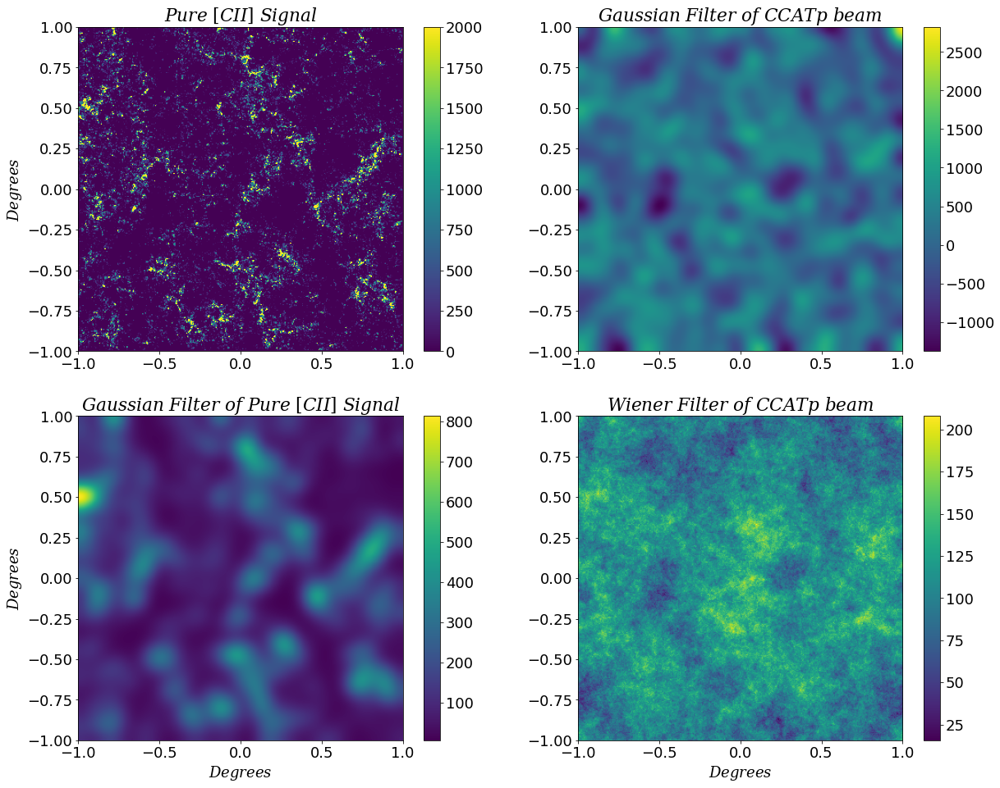

In [94]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 16))

plt.subplot(221)
plt.imshow(signal[:, :, 3], vmax = 2000, cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(222)
plt.imshow(gaussian_filter(cii_ccatp[:, :, 3], 10), cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(223)
plt.imshow(gaussian_filter(signal[:, :, 3], 10), cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(224)
plt.imshow(wiener_cii[:, :, 3], cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Wiener\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

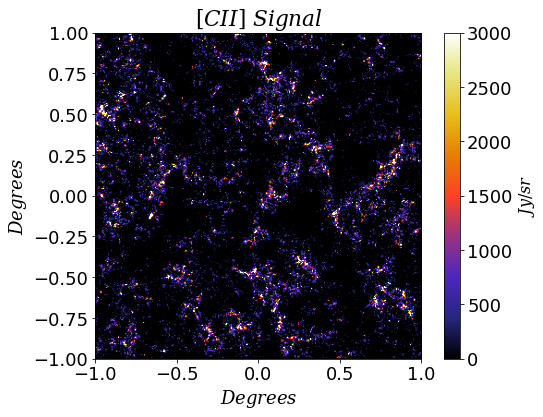

In [127]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (8, 6))

plt.subplot(111)
plt.imshow(signal[:, :, 3], vmax = 3000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
plt.title(r'$[CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
cb1 = plt.colorbar(label = r'$Jy/sr$')
ax1 = cb1.ax
text1 = ax1.yaxis.label
font = matplotlib.font_manager.FontProperties(math_fontfamily='dejavuserif', style='italic', size=16)
text1.set_font_properties(font)
plt.savefig('cii_signal.pdf', bbox_inches = "tight")

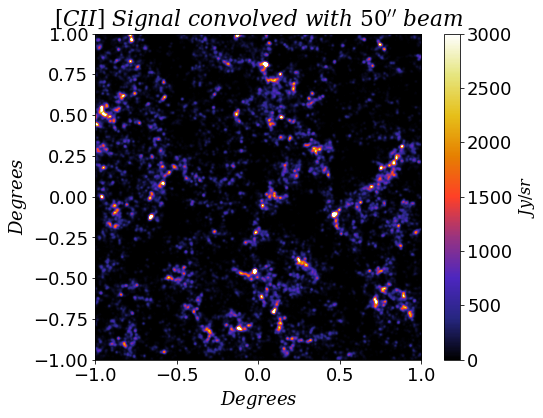

In [130]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (8, 6))

plt.subplot(111)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), vmax = 3000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
plt.title(r"$[CII]\ Signal\ convolved\ with\ 50''\ beam$", math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
cb2 = plt.colorbar(label = r'$Jy/sr$')
ax2 = cb2.ax
text2 = ax2.yaxis.label
font = matplotlib.font_manager.FontProperties(math_fontfamily='dejavuserif', style='italic', size=16)
text2.set_font_properties(font)
plt.savefig('cii_beam.pdf', bbox_inches = "tight")

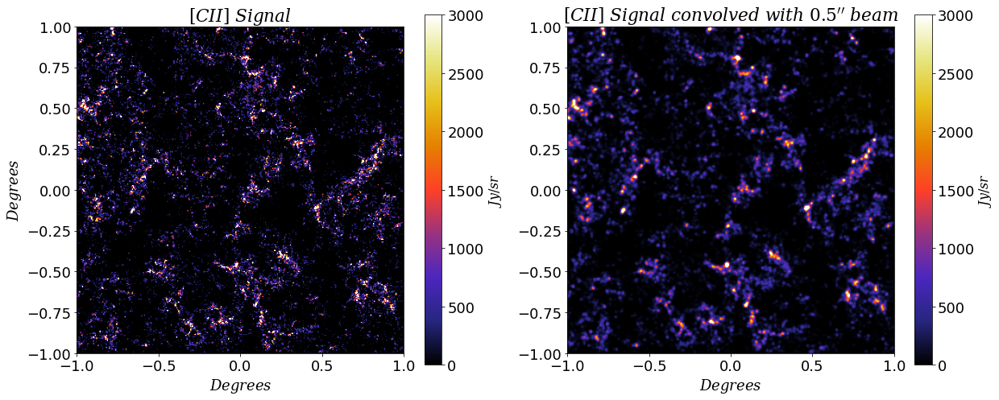

In [121]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 8))

plt.subplot(121)
plt.imshow(signal[:, :, 3], vmax = 3000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
plt.title(r'$[CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
cb1 = plt.colorbar(label = r'$Jy/sr$')
ax1 = cb1.ax
text1 = ax1.yaxis.label
font = matplotlib.font_manager.FontProperties(math_fontfamily='dejavuserif', style='italic', size=16)
text1.set_font_properties(font)


plt.subplot(122)
plt.imshow(gaussian_filter(signal[:, :, 3], 1), vmax = 3000, cmap =  'CMRmap', extent = [-1, 1, -1, 1])
plt.title(r"$[CII]\ Signal\ convolved\ with\ 0.5''\ beam$", math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
cb2 = plt.colorbar(label = r'$Jy/sr$')
ax2 = cb2.ax
text2 = ax2.yaxis.label
font = matplotlib.font_manager.FontProperties(math_fontfamily='dejavuserif', style='italic', size=16)
text2.set_font_properties(font)

#plt.savefig('cii_beam.pdf', bbox_inches = "tight")

In [80]:
zs = (m_cii.mapinst.nu_rest/m_cii.mapinst.nu_bincents) - 1

In [81]:
zs[3]

5.870422535211265

$t_{obs}$ = 40 000h

In [10]:
signal = m_cii.maps

In [11]:
cii_ccatp = m_cii.noise_added_map

<class 'astropy.units.quantity.Quantity'>


In [7]:
Pnoise = m_cii.Pnoise.value

k_sim = m_cii.k_sim
Pk_sim = m_cii.Pk_sim

P_noise = np.array([Pnoise for i in range(len(k_sim))])

Loading .npz catalogues...


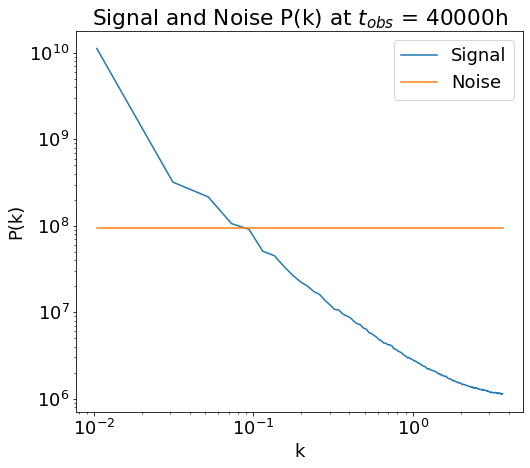

In [9]:
plt.plot(k_sim, Pk_sim, label = 'Signal')
plt.plot(k_sim, P_noise, label = 'Noise')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'Signal and Noise P(k) at $t_{obs}$ = 40000h')
plt.legend()

In [12]:
from limlam_mocker.limlam_mocker import redshift_to_chi as rtc
from limlam_mocker.limlam_mocker import load_peakpatch_catalogue_cosmo as lppcc

x,y,z = m_cii.mapinst.pix_binedges_x, m_cii.mapinst.pix_binedges_y, m_cii.mapinst.nu_binedges
t     = cii_ccatp
cosmo = lppcc(m_cii.halo_info)
zco   = rtc(m_cii.mapinst.nu_rest/z - 1, cosmo)

avg_ctd = np.mean(zco)
xco     = x/(180)*np.pi*avg_ctd
yco     = y/(180)*np.pi*avg_ctd

dxco, dyco, dzco = [np.abs(np.mean(np.diff(d))) for d in (xco, yco, zco)]
Pk_3D            = np.abs(np.fft.rfftn(t)*dxco*dyco*dzco)**2/np.abs(np.ptp(xco)*np.ptp(yco)*np.ptp(zco))

kx        = 2*np.pi*np.fft.fftfreq(xco.size - 1, d = dxco)
ky        = 2*np.pi*np.fft.fftfreq(yco.size - 1, d = dyco)
kz        = 2*np.pi*np.fft.rfftfreq(zco.size - 1, d = dzco)

kgrid     = np.sqrt(sum(ki**2 for ki in np.meshgrid(kx, ky, kz, indexing = 'ij')))
dk        = max(np.diff(kx)[0], np.diff(ky)[0], np.diff(kz)[0])

kmax_dk   = int(np.ceil(max(np.amax(kx), np.amax(ky), np.amax(kz))/dk))
kbins     = np.linspace(0, kmax_dk*dk, kmax_dk + 1)

Pk_nmodes = np.histogram(kgrid[kgrid > 0], bins = kbins, weights = Pk_3D[kgrid > 0])[0]
nmodes    = np.histogram(kgrid[kgrid > 0], bins = kbins)[0]

Pk_m = Pk_nmodes/nmodes
k_m  = (kbins[1:] + kbins[:-1])/2

In [13]:
from scipy import interpolate

W_k = Pk_sim.value/(Pk_sim.value + P_noise)
interp = interpolate.interp1d(k_m, W_k, fill_value = 'extrapolate')
new_t = np.fft.rfftn(t)*interp(kgrid)
wiener_cii = np.fft.irfftn(new_t)

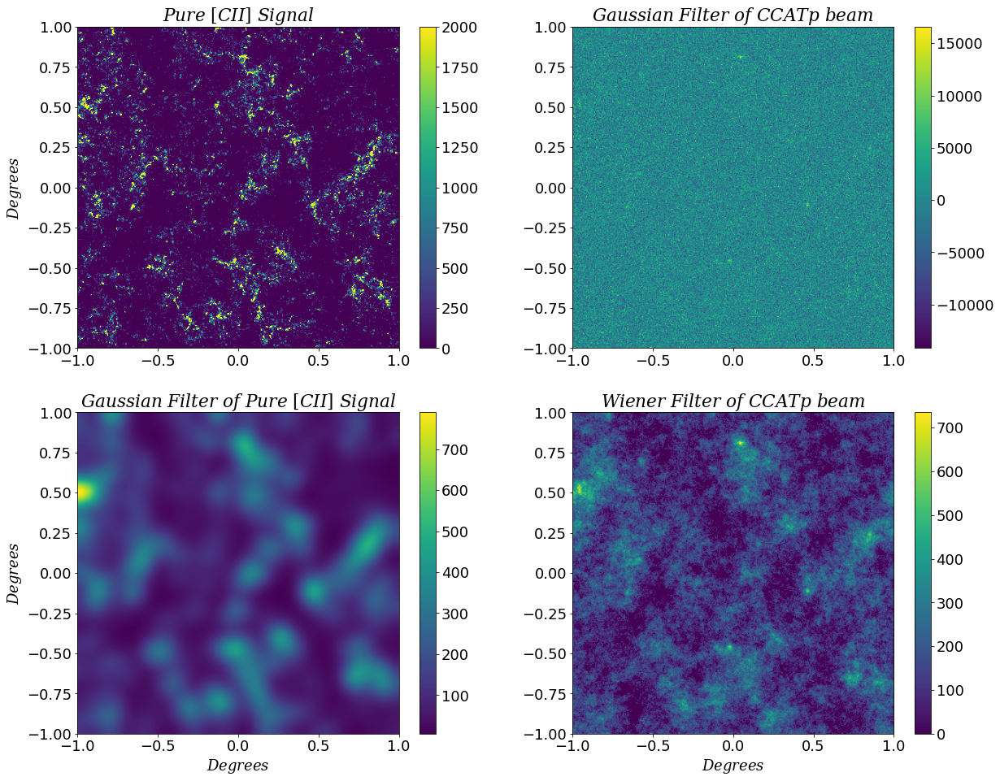

In [48]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 16))

plt.subplot(221)
plt.imshow(signal[:, :, 3], vmax = 2000, cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(222)
plt.imshow(cii_ccatp[:, :, 3], cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(223)
plt.imshow(gaussian_filter(signal[:, :, 3], 10), cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(224)
plt.imshow(wiener_cii[:, :, 3], vmin = 0, cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Wiener\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

Previous CII model:

In [45]:
m_cii_old = lim('Lichen', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [46]:
cii_signal_old = m_cii_old.maps

Loading .npz catalogues...


In [47]:
cii_ccatp_old = m_cii_old.noise_added_map

In [70]:
Pnoise_old = m_cii_old.Pnoise.value

k_sim_old = m_cii_old.k_sim
Pk_sim_old = m_cii_old.Pk_sim

P_noise_old = np.array([Pnoise for i in range(len(k_sim))])

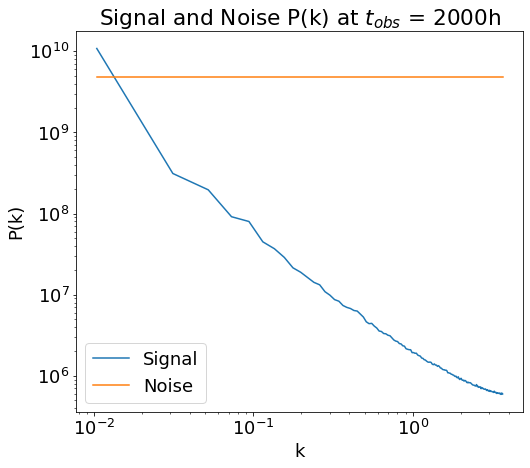

In [71]:
plt.plot(k_sim_old, Pk_sim_old, label = 'Signal')
plt.plot(k_sim_old, P_noise_old, label = 'Noise')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'Signal and Noise P(k) at $t_{obs}$ = 2000h')
plt.legend()

In [72]:
from limlam_mocker.limlam_mocker import redshift_to_chi as rtc
from limlam_mocker.limlam_mocker import load_peakpatch_catalogue_cosmo as lppcc

x,y,z = m_cii_old.mapinst.pix_binedges_x, m_cii_old.mapinst.pix_binedges_y, m_cii_old.mapinst.nu_binedges
t     = m_cii_old.noise_added_map
cosmo = lppcc(m_cii_old.halo_info)
zco   = rtc(m_cii_old.mapinst.nu_rest/z - 1, cosmo)

avg_ctd = np.mean(zco)
xco     = x/(180)*np.pi*avg_ctd
yco     = y/(180)*np.pi*avg_ctd

dxco, dyco, dzco = [np.abs(np.mean(np.diff(d))) for d in (xco, yco, zco)]
Pk_3D            = np.abs(np.fft.rfftn(t)*dxco*dyco*dzco)**2/np.abs(np.ptp(xco)*np.ptp(yco)*np.ptp(zco))

kx        = 2*np.pi*np.fft.fftfreq(xco.size - 1, d = dxco)
ky        = 2*np.pi*np.fft.fftfreq(yco.size - 1, d = dyco)
kz        = 2*np.pi*np.fft.rfftfreq(zco.size - 1, d = dzco)

kgrid     = np.sqrt(sum(ki**2 for ki in np.meshgrid(kx, ky, kz, indexing = 'ij')))
dk        = max(np.diff(kx)[0], np.diff(ky)[0], np.diff(kz)[0])

kmax_dk   = int(np.ceil(max(np.amax(kx), np.amax(ky), np.amax(kz))/dk))
kbins     = np.linspace(0, kmax_dk*dk, kmax_dk + 1)

Pk_nmodes = np.histogram(kgrid[kgrid > 0], bins = kbins, weights = Pk_3D[kgrid > 0])[0]
nmodes    = np.histogram(kgrid[kgrid > 0], bins = kbins)[0]

Pk_m = Pk_nmodes/nmodes
k_m  = (kbins[1:] + kbins[:-1])/2

In [73]:
from scipy import interpolate

W_k = Pk_sim.value/(Pk_sim.value + P_noise)
interp = interpolate.interp1d(k_m, W_k, fill_value = 'extrapolate')
new_t = np.fft.rfftn(t)*interp(kgrid)
wiener_cii = np.fft.irfftn(new_t)

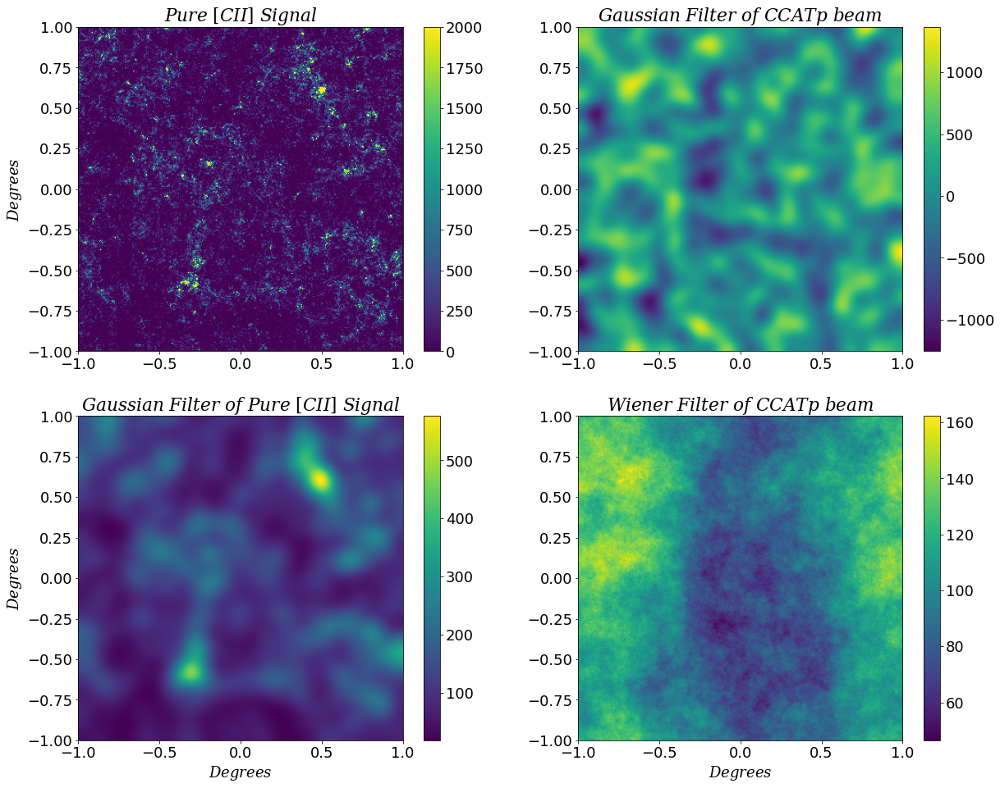

In [83]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 16))

plt.subplot(221)
plt.imshow(cii_signal_old[:, :, 3], vmax = 2000, cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(222)
plt.imshow(gaussian_filter(cii_ccatp_old[:, :, 3], 10), cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(223)
plt.imshow(gaussian_filter(cii_signal_old[:, :, 3], 10), cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Gaussian\ Filter\ of\ Pure\ [CII]\ Signal$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.ylabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

plt.subplot(224)
plt.imshow(wiener_cii[:, :, 3], cmap =  'viridis', extent = [-1, 1, -1, 1])
plt.title(r'$Wiener\ Filter\ of\ CCATp\ beam$', math_fontfamily = 'dejavuserif')
plt.xlabel(r'$Degrees$', math_fontfamily = 'dejavuserif')
plt.colorbar()

## Old versus New CII Model

In [68]:
m_cii.Pnoise

<Quantity 1.87142602e+09 Jy2 Mpc3 / sr2>

In [69]:
m_cii_old.Pnoise

<Quantity 4.81223833e+09 Jy2 Mpc3 / sr2>

New:

In [16]:
Pnoise_40 = m_cii.Pnoise.value

k_sim_40 = m_cii.k_sim
Pk_sim_40 = m_cii.Pk_sim

P_noise_40 = np.array([Pnoise_40 for i in range(len(k_sim_40))])

In [28]:
from limlam_mocker.limlam_mocker import redshift_to_chi as rtc
from limlam_mocker.limlam_mocker import load_peakpatch_catalogue_cosmo as lppcc

x,y,z = m_cii.mapinst.pix_binedges_x, m_cii.mapinst.pix_binedges_y, m_cii.mapinst.nu_binedges
t     = cii_ccatp
cosmo = lppcc(m_cii.halo_info)
zco   = rtc(m_cii.mapinst.nu_rest/z - 1, cosmo)

avg_ctd = np.mean(zco)
xco     = x/(180)*np.pi*avg_ctd
yco     = y/(180)*np.pi*avg_ctd

dxco, dyco, dzco = [np.abs(np.mean(np.diff(d))) for d in (xco, yco, zco)]
Pk_3D            = np.abs(np.fft.rfftn(t)*dxco*dyco*dzco)**2/np.abs(np.ptp(xco)*np.ptp(yco)*np.ptp(zco))

kx        = 2*np.pi*np.fft.fftfreq(xco.size - 1, d = dxco)
ky        = 2*np.pi*np.fft.fftfreq(yco.size - 1, d = dyco)
kz        = 2*np.pi*np.fft.rfftfreq(zco.size - 1, d = dzco)

kgrid     = np.sqrt(sum(ki**2 for ki in np.meshgrid(kx, ky, kz, indexing = 'ij')))
dk        = max(np.diff(kx)[0], np.diff(ky)[0], np.diff(kz)[0])

kmax_dk   = int(np.ceil(max(np.amax(kx), np.amax(ky), np.amax(kz))/dk))
kbins     = np.linspace(0, kmax_dk*dk, kmax_dk + 1)

Pk_nmodes = np.histogram(kgrid[kgrid > 0], bins = kbins, weights = Pk_3D[kgrid > 0])[0]
nmodes    = np.histogram(kgrid[kgrid > 0], bins = kbins)[0]

Pk_m_new = Pk_nmodes/nmodes
k_m_new  = (kbins[1:] + kbins[:-1])/2

Old:

In [19]:
m_cii_old = lim('Lichen', doSim = True)

Input cosmological model does not match simulations
Setting analytic cosmology to match simulation


In [20]:
m_cii_old.update(tobs = 40000*u.hr)

In [21]:
cii_signal_old = m_cii_old.maps

Loading .npz catalogues...


In [22]:
cii_ccatp_old = m_cii_old.noise_added_map

<class 'astropy.units.quantity.Quantity'>


In [39]:
Pnoise_old = m_cii_old.Pnoise.value

k_sim_old = m_cii_old.k_sim
Pk_sim_old = m_cii_old.Pk_sim

P_noise_old = np.array([Pnoise_old for i in range(len(k_sim_old))])

In [29]:
from limlam_mocker.limlam_mocker import redshift_to_chi as rtc
from limlam_mocker.limlam_mocker import load_peakpatch_catalogue_cosmo as lppcc

x,y,z = m_cii_old.mapinst.pix_binedges_x, m_cii_old.mapinst.pix_binedges_y, m_cii_old.mapinst.nu_binedges
t     = cii_ccatp_old
cosmo = lppcc(m_cii_old.halo_info)
zco   = rtc(m_cii_old.mapinst.nu_rest/z - 1, cosmo)

avg_ctd = np.mean(zco)
xco     = x/(180)*np.pi*avg_ctd
yco     = y/(180)*np.pi*avg_ctd

dxco, dyco, dzco = [np.abs(np.mean(np.diff(d))) for d in (xco, yco, zco)]
Pk_3D            = np.abs(np.fft.rfftn(t)*dxco*dyco*dzco)**2/np.abs(np.ptp(xco)*np.ptp(yco)*np.ptp(zco))

kx        = 2*np.pi*np.fft.fftfreq(xco.size - 1, d = dxco)
ky        = 2*np.pi*np.fft.fftfreq(yco.size - 1, d = dyco)
kz        = 2*np.pi*np.fft.rfftfreq(zco.size - 1, d = dzco)

kgrid     = np.sqrt(sum(ki**2 for ki in np.meshgrid(kx, ky, kz, indexing = 'ij')))
dk        = max(np.diff(kx)[0], np.diff(ky)[0], np.diff(kz)[0])

kmax_dk   = int(np.ceil(max(np.amax(kx), np.amax(ky), np.amax(kz))/dk))
kbins     = np.linspace(0, kmax_dk*dk, kmax_dk + 1)

Pk_nmodes = np.histogram(kgrid[kgrid > 0], bins = kbins, weights = Pk_3D[kgrid > 0])[0]
nmodes    = np.histogram(kgrid[kgrid > 0], bins = kbins)[0]

Pk_m_old = Pk_nmodes/nmodes
k_m_old  = (kbins[1:] + kbins[:-1])/2

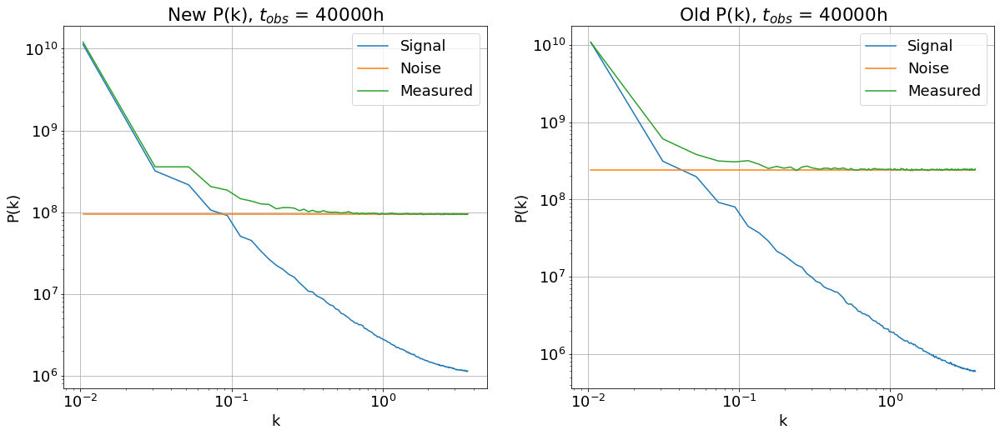

In [43]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 8))

plt.subplot(121)
plt.plot(k_sim_40, Pk_sim_40, label = 'Signal')
plt.plot(k_sim_40, P_noise_40, label = 'Noise')
plt.plot(k_m_new, Pk_m_new, label = 'Measured')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'New P(k), $t_{obs}$ = 40000h')
plt.legend()
plt.grid()

plt.subplot(122)
plt.plot(k_sim_old, Pk_sim_old, label = 'Signal')
plt.plot(k_sim_old, P_noise_old, label = 'Noise')
plt.plot(k_m_old, Pk_m_old, label = 'Measured')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'Old P(k), $t_{obs}$ = 40000h')
plt.legend()
plt.grid()

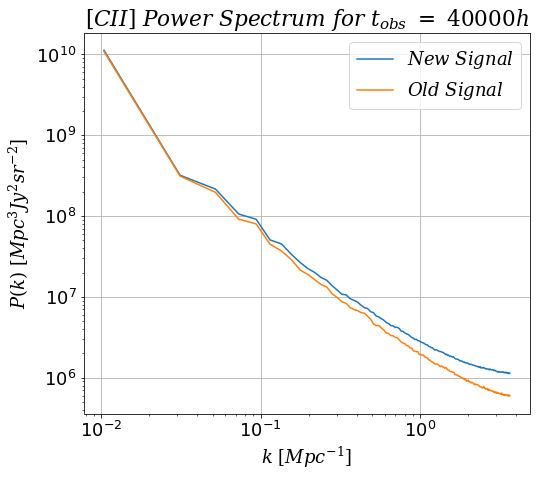

In [116]:
plt.rcParams["mathtext.fontset"] = "dejavuserif"

plt.plot(k_sim_40, Pk_sim_40, label = r'$New\ Signal$')
plt.plot(k_sim_old, Pk_sim_old, label = r'$Old\ Signal$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$k\ [Mpc^{-1}]$')
plt.ylabel(r'$P(k)\ [Mpc^3 Jy^2 sr^{-2}]$')
plt.title(r'$[CII]\ Power\ Spectrum\ for\ t_{obs}\ =\ 40000h$')
plt.legend()
plt.grid()
plt.savefig('pspec_comparison.pdf', bbox_inches = "tight")

In [114]:
with open('power_spectra.dat','w') as f:
    f.write('# k | P(k), new model with metallicity | P(k), old model.\r\n')
    f.write('# Units are Mpc^-1 for k and Mpc^3 * Jy^2 / sr^2 for both P(k).\r\n')
    for dat_tuple in zip(k_sim_40.value.flatten(), Pk_sim_40.value.flatten(), Pk_sim_old.value.flatten()):
        f.write('{:.6f} {:.6f} {:.6f}\r\n'.format(*dat_tuple))

In [113]:
Pk_sim_old.value.flatten()

array([1.08529498e+10, 3.12152520e+08, 1.96469408e+08, 9.15117999e+07,
       7.99168903e+07, 4.48719947e+07, 3.68999103e+07, 2.88432408e+07,
       2.14473490e+07, 1.89295933e+07, 1.63095338e+07, 1.42108762e+07,
       1.32457728e+07, 1.08883472e+07, 9.86822643e+06, 8.70660168e+06,
       8.31639166e+06, 7.36519052e+06, 6.98038175e+06, 6.75977030e+06,
       6.38995793e+06, 6.28682778e+06, 5.76051428e+06, 5.30777556e+06,
       4.63645244e+06, 4.39944493e+06, 4.43473924e+06, 4.10480884e+06,
       3.88886654e+06, 3.56657092e+06, 3.52068852e+06, 3.32422051e+06,
       3.29996316e+06, 3.16701256e+06, 3.12262249e+06, 2.93373187e+06,
       2.76518087e+06, 2.68116928e+06, 2.64624176e+06, 2.49955282e+06,
       2.47261000e+06, 2.34793988e+06, 2.32314856e+06, 2.16066303e+06,
       2.12480589e+06, 2.10053578e+06, 2.09858593e+06, 1.93159648e+06,
       1.93544238e+06, 1.89678047e+06, 1.90313525e+06, 1.80447949e+06,
       1.77214160e+06, 1.74937256e+06, 1.65756593e+06, 1.64454054e+06,
      

In [107]:
Pk_sim_40.unit

Unit("Jy2 Mpc3 / sr2")

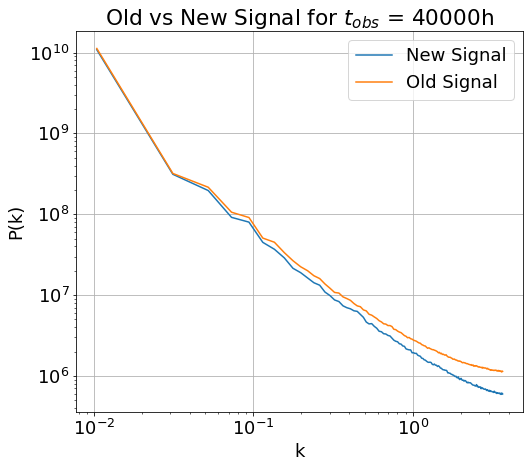

In [88]:
plt.plot(k_sim_old, Pk_sim_old, label = 'Old Signal')
plt.plot(k_sim_40, Pk_sim_40, label = 'New Signal')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.title(r'Old vs New Signal for $t_{obs}$ = 40000h')
plt.legend()
plt.grid()

In [93]:
m_cii.k_edge

<Quantity [ 0.01      ,  0.01071519,  0.01148154,  0.01230269,  0.01318257,
            0.01412538,  0.01513561,  0.0162181 ,  0.01737801,  0.01862087,
            0.01995262,  0.02137962,  0.02290868,  0.02454709,  0.02630268,
            0.02818383,  0.03019952,  0.03235937,  0.03467369,  0.03715352,
            0.03981072,  0.04265795,  0.04570882,  0.04897788,  0.05248075,
            0.05623413,  0.06025596,  0.06456542,  0.0691831 ,  0.07413102,
            0.07943282,  0.0851138 ,  0.09120108,  0.09772372,  0.10471285,
            0.11220185,  0.12022644,  0.12882496,  0.13803843,  0.14791084,
            0.15848932,  0.16982437,  0.18197009,  0.19498446,  0.20892961,
            0.22387211,  0.23988329,  0.25703958,  0.27542287,  0.29512092,
            0.31622777,  0.33884416,  0.36307805,  0.38904514,  0.41686938,
            0.44668359,  0.47863009,  0.51286138,  0.54954087,  0.58884366,
            0.63095734,  0.67608298,  0.72443596,  0.77624712,  0.83176377,
            

In [94]:
Nedge = m_cii.k_edge.size

In [95]:
Nedge

101

In [96]:
(m_cii.k_edge[0:Nedge-1] + m_cii.k_edge[1:Nedge])/2

<Quantity [0.0103576 , 0.01109836, 0.01189211, 0.01274263, 0.01365397,
           0.01463049, 0.01567686, 0.01679805, 0.01799944, 0.01928675,
           0.02066612, 0.02214415, 0.02372788, 0.02542488, 0.02724325,
           0.02919167, 0.03127944, 0.03351653, 0.0359136 , 0.03848212,
           0.04123433, 0.04418339, 0.04734335, 0.05072931, 0.05435744,
           0.05824505, 0.06241069, 0.06687426, 0.07165706, 0.07678192,
           0.08227331, 0.08815744, 0.0944624 , 0.10121829, 0.10845735,
           0.11621414, 0.1245257 , 0.13343169, 0.14297463, 0.15320008,
           0.16415684, 0.17589723, 0.18847727, 0.20195704, 0.21640086,
           0.2318777 , 0.24846144, 0.26623122, 0.2852719 , 0.30567434,
           0.32753596, 0.35096111, 0.3760616 , 0.40295726, 0.43177649,
           0.46265684, 0.49574574, 0.53120113, 0.56919226, 0.6099005 ,
           0.65352016, 0.70025947, 0.75034154, 0.80400544, 0.86150735,
           0.92312176, 0.98914279, 1.05988559, 1.13568788, 1.21691148,
      

In [97]:
(m_cii.k_edge[0:Nedge-1] + m_cii.k_edge[1:Nedge])/2

<Quantity [0.0103576 , 0.01109836, 0.01189211, 0.01274263, 0.01365397,
           0.01463049, 0.01567686, 0.01679805, 0.01799944, 0.01928675,
           0.02066612, 0.02214415, 0.02372788, 0.02542488, 0.02724325,
           0.02919167, 0.03127944, 0.03351653, 0.0359136 , 0.03848212,
           0.04123433, 0.04418339, 0.04734335, 0.05072931, 0.05435744,
           0.05824505, 0.06241069, 0.06687426, 0.07165706, 0.07678192,
           0.08227331, 0.08815744, 0.0944624 , 0.10121829, 0.10845735,
           0.11621414, 0.1245257 , 0.13343169, 0.14297463, 0.15320008,
           0.16415684, 0.17589723, 0.18847727, 0.20195704, 0.21640086,
           0.2318777 , 0.24846144, 0.26623122, 0.2852719 , 0.30567434,
           0.32753596, 0.35096111, 0.3760616 , 0.40295726, 0.43177649,
           0.46265684, 0.49574574, 0.53120113, 0.56919226, 0.6099005 ,
           0.65352016, 0.70025947, 0.75034154, 0.80400544, 0.86150735,
           0.92312176, 0.98914279, 1.05988559, 1.13568788, 1.21691148,
      

In [99]:
m_cii.k_edge

<Quantity [ 0.01      ,  0.01071519,  0.01148154,  0.01230269,  0.01318257,
            0.01412538,  0.01513561,  0.0162181 ,  0.01737801,  0.01862087,
            0.01995262,  0.02137962,  0.02290868,  0.02454709,  0.02630268,
            0.02818383,  0.03019952,  0.03235937,  0.03467369,  0.03715352,
            0.03981072,  0.04265795,  0.04570882,  0.04897788,  0.05248075,
            0.05623413,  0.06025596,  0.06456542,  0.0691831 ,  0.07413102,
            0.07943282,  0.0851138 ,  0.09120108,  0.09772372,  0.10471285,
            0.11220185,  0.12022644,  0.12882496,  0.13803843,  0.14791084,
            0.15848932,  0.16982437,  0.18197009,  0.19498446,  0.20892961,
            0.22387211,  0.23988329,  0.25703958,  0.27542287,  0.29512092,
            0.31622777,  0.33884416,  0.36307805,  0.38904514,  0.41686938,
            0.44668359,  0.47863009,  0.51286138,  0.54954087,  0.58884366,
            0.63095734,  0.67608298,  0.72443596,  0.77624712,  0.83176377,
            

In [86]:
Pk_sim_40

<Quantity [1.12438035e+10, 3.19679521e+08, 2.15740517e+08, 1.05973802e+08,
           9.11314526e+07, 5.07087716e+07, 4.50581442e+07, 3.35106077e+07,
           2.66163990e+07, 2.24006377e+07, 2.00111752e+07, 1.73475915e+07,
           1.60130623e+07, 1.37109125e+07, 1.21609932e+07, 1.07832242e+07,
           1.05934903e+07, 9.50217984e+06, 9.05514270e+06, 8.59998290e+06,
           7.86365027e+06, 7.35308050e+06, 7.18029965e+06, 6.55934926e+06,
           6.37559906e+06, 5.79083572e+06, 5.64428867e+06, 5.36479137e+06,
           5.12875394e+06, 4.81842696e+06, 4.65382759e+06, 4.41171727e+06,
           4.37583097e+06, 4.19669934e+06, 4.19592771e+06, 4.07932710e+06,
           3.77315559e+06, 3.73760210e+06, 3.58628603e+06, 3.48920876e+06,
           3.42743961e+06, 3.28858195e+06, 3.15241942e+06, 3.09267188e+06,
           2.96438771e+06, 2.99026289e+06, 2.88291500e+06, 2.84787408e+06,
           2.76548456e+06, 2.72187286e+06, 2.68775429e+06, 2.61441677e+06,
           2.55761412e+06

In [87]:
Pk_sim_old

<Quantity [1.08529498e+10, 3.12152520e+08, 1.96469408e+08, 9.15117999e+07,
           7.99168903e+07, 4.48719947e+07, 3.68999103e+07, 2.88432408e+07,
           2.14473490e+07, 1.89295933e+07, 1.63095338e+07, 1.42108762e+07,
           1.32457728e+07, 1.08883472e+07, 9.86822643e+06, 8.70660168e+06,
           8.31639166e+06, 7.36519052e+06, 6.98038175e+06, 6.75977030e+06,
           6.38995793e+06, 6.28682778e+06, 5.76051428e+06, 5.30777556e+06,
           4.63645244e+06, 4.39944493e+06, 4.43473924e+06, 4.10480884e+06,
           3.88886654e+06, 3.56657092e+06, 3.52068852e+06, 3.32422051e+06,
           3.29996316e+06, 3.16701256e+06, 3.12262249e+06, 2.93373187e+06,
           2.76518087e+06, 2.68116928e+06, 2.64624176e+06, 2.49955282e+06,
           2.47261000e+06, 2.34793988e+06, 2.32314856e+06, 2.16066303e+06,
           2.12480589e+06, 2.10053578e+06, 2.09858593e+06, 1.93159648e+06,
           1.93544238e+06, 1.89678047e+06, 1.90313525e+06, 1.80447949e+06,
           1.77214160e+06

In [95]:
m_cii.update(tobs = 40000*u.hr)

AttributeError: Bi